## Introduction
Object detection is a fundamental task in computer vision. The problem of object recognition essentially consists of first localizing the object and then classifying it with a semantic label. In recent deep learning based methods, YOLO is an extremely fast real time multi object detection algorithm.  
  
<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW2/fig2_1.png"/></div>
<center>Figure 1: This is a demo of what object detection does. The color indicates different semantic class.</center>  
  
In this project, we provide 10K street scene images with correponding labels as training data. The image dimension is $128 \times 128 \times 3$, and the labels include the semantic class and the bounding box corresponding to each object in the image. Note that a small portion of these ground-truth labels are not a little bit noisy and the quantity of the training set is not very large, so we do not expect you to learn a super robust object detector.

## Data Preprocessing
For this section, you will need to write code to preprocess the ground truth labels for the YOLO algorithm. The
labels are provided in the "label" folder. The format of the labels are (class, $x_1$, $y_1$, $x_2$, $y_2$), where $x_1$, $y_1$ are the top left corner of the bounding box and $x_2$, $y_2$ are the bottom right corner of the bounding box.  
  
<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW2/fig2_2.png"/></div>
<center>Figure 2: This figure demonstrates the format of ground-truth labels that YOLO algorithm requires.</center>  
  
For each image, you are required to convert the provided labels into the $8 \times 8 \times 8$ ground truth matrix, which has the same dimension as the output of YOLO detection network. The instructions of this conversion is as follows:
* We consider a $16 \times 16$ image patch as a grid cell and thus divide the full image into $8 \times 8$ patches in the 2D spatial dimension. In the output activation space, one grid cell represents one 16x16 image patch with corresponding aligned locations.
* For simplified YOLO, we only use one anchor box, where we assume the anchor size is the same as the grid cell size. If the center of an object falls into a grid cell, that grid cell is responsible for detecting that object. This means that there is only one anchor for each object instance.
* For each anchor, there are 8 channels, which encode Pr(Objectness), $x$, $y$, $w$, $h$, P(class=pedestrian),  P(class=traffic light), and P(class=car).
* The Pr(Objectness) is the probability of whether this anchor is an object or background. When assigning the ground-truth for this value, "1" indicates object and "0" indicates background.
* The channels 2-5, $x$, $y$ coordinates represent the center of the box relative to the bounds of the grid cell; $w$, $h$ is relative to the image width and height.
* In channels 6-8, you need to convert the ground truth semantic label of each object into one-hot coding for each anchor boxes.
* Note that if the anchor box does not have any object (Pr=0), you donâ€™t need to assign any values to channels 2-8, since we will not use them during training.
* The dimensions are ordered (channels, x, y).

## Model Architecture
You are required to implement the model architecture using the following parameters. This model takes input with dimension of $128 \times 128 \times 3$ and outputs an activation with dimension of $8 \times 8 \times 8$.

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW2/fig2_3.png"/></div>
<center>Figure 3: This figure demonstrates how to compute IoU.</center>

| Layer | Hyperparameters |
| :-: | :-: |
| conv1 | Kernel size $= 4 \times 4 \times 32$, stride $=2$, pad $=1$. Followed by BatchNorm and ReLU. |
| conv2 | Kernel size $= 4 \times 4 \times 64$, stride $=2$, pad $=1$. Followed by BatchNorm and ReLU. |
| conv3 | Kernel size $= 4 \times 4 \times 128$, stride $=2$, pad $=1$. Followed by BatchNorm and ReLU. |
| conv4 | Kernel size $= 4 \times 4 \times 256$, stride $=2$, pad $=1$. Followed by BatchNorm and ReLU. |
| conv5 | Kernel size $= 4 \times 4 \times 512$, stride $=2$, pad $=1$. Followed by BatchNorm and ReLU. |
| conv6 | Kernel size $= 4 \times 4 \times 1024$, stride $=2$, pad $=1$. Followed by BatchNorm and ReLU. |
| transposed_conv7 | Kernel size $= 4 \times 4 \times 256$, stride $=2$, pad $=1$. Followed by BatchNorm and ReLU. |
| transposed_conv8 | Kernel size $= 4 \times 4 \times 64$, stride $=2$, pad $=1$. Followed by BatchNorm and ReLU. |
| conv9 | Kernel size $= 3 \times 3 \times 8$, stride $=1$, pad $=1$. |


## Training Details
During training, the localization and classification errors are optimized jointly. The loss function is shown
as below.  $i$ indicates number of grid cells and $j$ indicates number of anchor boxes at each grid cell. In our
case, there is only one anchor box at each grid cell and $B = 1$.

$$ \text{Loss} =
{\lambda_\text{coord} \sum_{i=0}^{S^2} \sum_{j=0}^B \mathbb{1}_{ij}^\text{obj} \left[{\left(x_i - \hat{x}_i\right)}^2 + {\left(y_i - \hat{y}_i\right)}^2\right]} +
{\lambda_\text{coord} \sum_{i=0}^{S^2} \sum_{j=0}^B \mathbb{1}_{ij}^\text{obj} \left[{\left(\sqrt{w_i} - \sqrt{\hat{w}_i}\right)}^2 + {\left(\sqrt{h_i} - \sqrt{\hat{h}_i}\right)}^2\right]} +
{\sum_{i=0}^{S^2} \sum_{j=0}^B \mathbb{1}_{ij}^\text{obj} \left(C_i - \hat{C}_i\right)^2} +
{\lambda_\text{no obj} \sum_{i=0}^{S^2} \sum_{j=0}^B \mathbb{1}_{ij}^\text{no obj} \left(C_i - \hat{C}_i\right)^2} +
{\sum_{i=0}^{S^2} \mathbb{1}_{ij}^\text{obj} \sum_{c\, \in\, \text{classes}} \left(p_i(c) - \hat{p}_i(c)\right)^2}$$

* In our case there is only one anchor box at each grid, hence $B = 1$.
* $S^2 =$ total number of grid cells.
* $\mathbb{1}_{ij}^\text{obj} = 1$ if an object appears in grid cell $i$ and 0 otherwise.
* $\mathbb{1}_{ij}^\text{no obj}$ is the compliment of $\mathbb{1}_{ij}^\text{obj}$.
* $\hat{C}_i =$ Box confidence score $=$ Pr(box contains object) $\times$ IoU
* IoU $=$ Intersection over union between the predicted and the ground truth.
* $\hat{p}_i(c) =$ conditional class probability of class $c$ in cell $i$.

$\lambda_\text{coord}$ and and $\lambda_\text{no obj}$ are two hyperparameters for coordinate predictions and non-objectness classification. We set $\lambda_\text{coord} = 5$ and and $\lambda_\text{no obj} = 0.5$.

Each grid cell predicts 1 bounding box, confidence score for those boxes and class conditional probabilities.

The confidence Score reflects the degree of confidence that the box contains an object and how accurate the box is. If no object exists in the cell then the confidence score should be 0 else the confidence score should be equal to the IOU between the predicted box and the ground truth box.

During training, you can set learning rate of 10e-3 using Adam optimizer with default beta 1 and beta 2. You are encourage to adaptively adjust learning rate during training to see if the model will converge better. You should also visualize the loss over training iterations. You will need to decide at the iteration to stop training based on the loss visualization. (At least 20 epochs of training is required.)

## Post-Processing
During inference, the network is going to predict lots of overlapping redundant bounding boxes. To eliminate the redundant boxes, there are basically two steps:

1. Get rid of predicted boxes with low objectness probability (Pr $< 0.6$).
2. For each class, calculate the IoU for all the bounding boxes and cluster boxes with IoU > 0.5 as a group. For each group, find the one with highest Pr and suppress the other boxes. This is referred as non-max suppression.

To evaluate the performance of your YOLO implementation, compute the mean Average Precision (mAP) of inference. Predicted bounding boxes are a match with ground truth bounding boxes if they share the same label and have an IoU with the ground truth bounding box of greater than 0.5. These matches can be used to calculate a precision/recall curve for each class. The Average Precision for a class is the area under this curve. The mean of these Average Precision values over all the classes in inference gives the mean Average Precision of your network.

<div><img src="https://github.com/LukasZhornyak/CIS680_files/raw/main/HW2/fig2_4.png"/></div>
<center>Figure 4: This figure demonstrates post-process of how to get rid of redundant bounding box.</center>

## Code

In [1]:
!pip install pytorch_lightning &> /dev/null
# !pip install torchviz &> /dev/null

import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
import pytorch_lightning as pl
import pytorch_lightning.loggers as pl_loggers
import pytorch_lightning.callbacks as pl_callbacks
from pytorch_lightning.loggers import TensorBoardLogger
import matplotlib.patches as patches
from torch.utils.data import TensorDataset, DataLoader
from torch.utils.data.dataset import Dataset
import torchvision
from torchvision import transforms
# from torchviz import make_dot
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR

# CUDA for PyTorch
use_cuda = torch.cuda.is_available()
device = torch.device("cuda:0" if use_cuda else "cpu")
seed = 17
torch.manual_seed(seed);

In [2]:
# from google.colab import drive
# drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# download the data
# if this fails, you can download manually and upload to colab
# manual download link: https://drive.google.com/file/d/1NzN5m3aaQ5XpSEV6toRZiUAGvSh4Ojs4/view?usp=sharing
# !wget 'https://drive.google.com/uc?export=download&id=1NzN5m3aaQ5XpSEV6toRZiUAGvSh4Ojs4' -O labels.npz
# !wget 'https://drive.google.com/uc?export=download&id=1MT-J-hgix3BX7HpUumNQiX5J-By47vt1&confirm=t&uuid=e26a8982-e398-4c5e-974d-1459e3599e6c&at=AB6BwCBY6SHI_fcCMpuRgoG38F7K:1694019172385' -O images.npz

--2023-09-25 00:40:56--  https://drive.google.com/uc?export=download&id=1NzN5m3aaQ5XpSEV6toRZiUAGvSh4Ojs4
Resolving drive.google.com (drive.google.com)... 64.233.188.102, 64.233.188.101, 64.233.188.113, ...
Connecting to drive.google.com (drive.google.com)|64.233.188.102|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-00-9o-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/6osph80gjjapcahuhqcspb98ftt4isam/1695602400000/14871726518408366222/*/1NzN5m3aaQ5XpSEV6toRZiUAGvSh4Ojs4?e=download&uuid=073e9833-6651-4f15-af38-f93cd290ca10 [following]
--2023-09-25 00:40:58--  https://doc-00-9o-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/6osph80gjjapcahuhqcspb98ftt4isam/1695602400000/14871726518408366222/*/1NzN5m3aaQ5XpSEV6toRZiUAGvSh4Ojs4?e=download&uuid=073e9833-6651-4f15-af38-f93cd290ca10
Resolving doc-00-9o-docs.googleusercontent.com (doc-00-9o-docs.googleusercontent.com)... 142.251.170.132, 2404

In [3]:
# Use this function to import the provided data files
def load_data(file_name):
    return np.load(file_name, allow_pickle=True, encoding='latin1')['arr_0']

import traceback
try:
  images = load_data('/content/drive/MyDrive/images.npz')
  raw_labels = load_data('/content/drive/MyDrive/labels.npz')
except Exception as e:
  print(e)
  traceback.print_exc()
  print("load failed, maybe manual download")

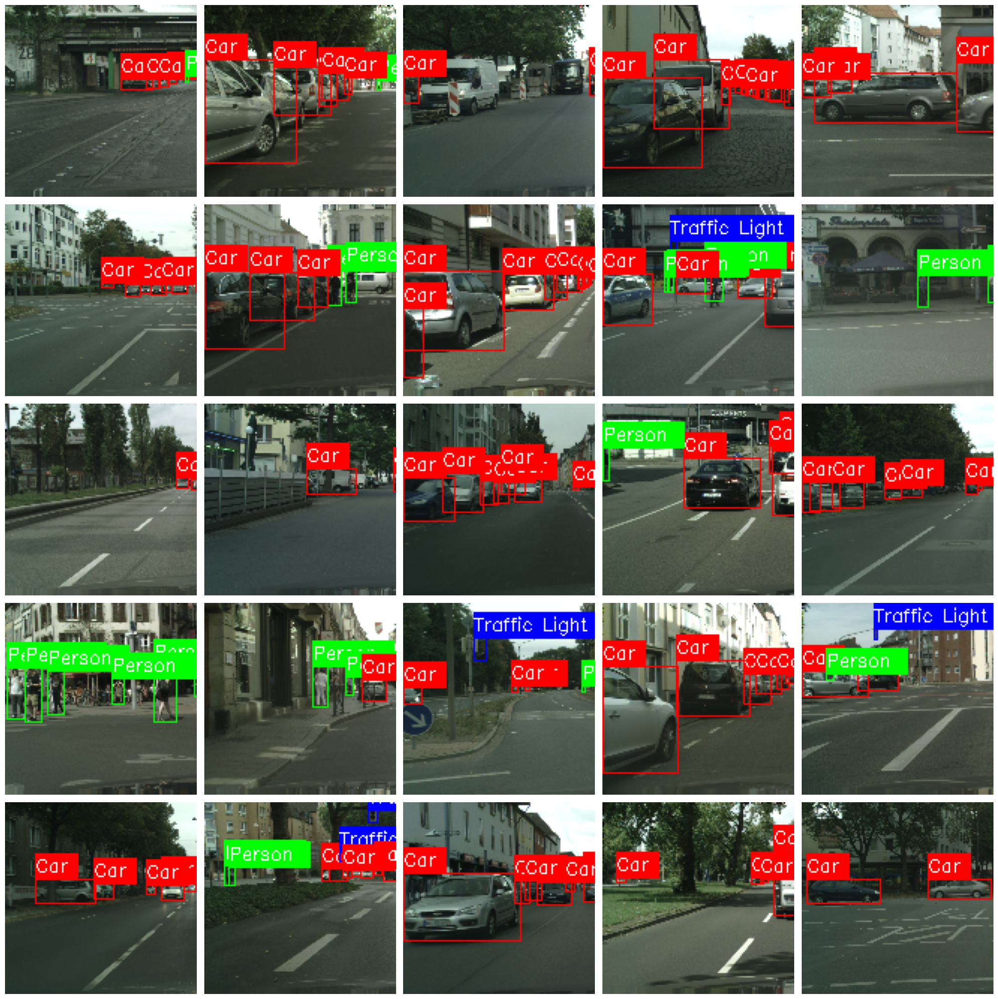

In [71]:
import cv2
#  Define class names
class_names = {
    0: "Person",
    1: "Traffic Light",
    2: "Car"
}

# Define colors for different classes
class_colors = {
    0: (0, 255, 0),  # Green for Person
    1: (255, 0, 0),  # Red for Traffic Light
    2: (0, 0, 255)   # Blue for Car
}

# Reference: https://stackoverflow.com/questions/63923800/drawing-bounding-rectangles-around-multiple-objects-in-binary-image-in-python

# Function to visualize bounding boxes
def visualize_bounding_boxes(image, labels, class_names, class_colors, thickness):
    for label in labels:
        class_id, x_min, y_min, x_max, y_max = label
        class_id = int(class_id)

        # Get the class name and color
        class_name = class_names.get(class_id, "Unknown")
        color = class_colors.get(class_id, (0, 0, 0))

        # Draw bounding box
        cv2.rectangle(image, (int(x_min), int(y_min)), (int(x_max), int(y_max)), color, thickness)

        # Add class name as text label
        label_text = f"{class_name}"
        label_size, base_line = cv2.getTextSize(label_text, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)
        y_min_text = max(int(y_min) - 5, 0)  # Adjust vertical position of label
        cv2.rectangle(image, (int(x_min), y_min_text - label_size[1]), (int(x_min) + label_size[0], y_min_text + base_line), color, cv2.FILLED)
        cv2.putText(image, label_text, (int(x_min), y_min_text), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (255, 255, 255), 1)

    return image

# Create a 5x5 grid of subplots
num_rows = 5
num_cols = 5
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 20))  # Adjust figsize as needed

for i in range(num_rows):
    for j in range(num_cols):
        image_idx = i * num_cols + j  # Calculate the index of the image to display
        if image_idx < len(images):
            image = images[image_idx].copy()
            labels = raw_labels[image_idx]

            # Convert image to BGR format for OpenCV
            image_bgr = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

            # Visualize bounding boxes on the image
            image_with_boxes = visualize_bounding_boxes(image_bgr, labels, class_names, class_colors, thickness=1)  # Adjust thickness

            # Display the image with bounding boxes in the subplot
            axes[i, j].imshow(cv2.cvtColor(image_with_boxes, cv2.COLOR_BGR2RGB))
            axes[i, j].axis('off')
        else:
            # If there are no more images to display, remove the empty subplot
            fig.delaxes(axes[i, j])

# Adjust subplot layout
plt.tight_layout()
plt.show()

In [28]:
def process_labels(raw_labels):
    raw_labels = raw_labels[0]
    image_dim = 128
    GRID_SIZE = 16
    labels = np.zeros((8, 8, 8), dtype=np.float64)

    # Iterate through each bounding box in raw_labels
    for box in raw_labels:
        # Extract box coordinates
        class_label, x1, y1, x2, y2 = box[0], box[1], box[2], box[3], box[4]

        # Probability of the object's presence
        object_presence = 1.0

        # Calculate the center coordinates
        x_center = (x1 + x2) / 2.0
        y_center = (y1 + y2) / 2.0

        # Calculate the width and height of the box
        box_width = x2 - x1
        box_height = y2 - y1

        # Calculate relative width and height
        relative_width = box_width / image_dim
        relative_height = box_height / image_dim

        # Create a one-hot encoded vector for class labels
        class_one_hot = [0.0, 0.0, 0.0]
        class_one_hot[int(class_label)] = 1.0

        # Calculate the grid cell coordinates for x and y
        x_relative_to_grid = x_center / GRID_SIZE
        x_grid_coordinate = int(x_relative_to_grid)
        x_relative_value = x_relative_to_grid - x_grid_coordinate

        y_relative_to_grid = y_center / GRID_SIZE
        y_grid_coordinate = int(y_relative_to_grid)
        y_relative_value = y_relative_to_grid - y_grid_coordinate

        # Create the processed label
        processed_label = np.asarray([object_presence, x_relative_value, y_relative_value, relative_width, relative_height] + class_one_hot)

        # Assign the processed label to the corresponding grid cell
        labels[y_grid_coordinate][x_grid_coordinate] = processed_label  # Note the order of indices

    return labels
labels = process_labels([raw_labels[45]])
print(labels)

In [5]:
def calculate_coordinates(label, row, col, grid_size, image_dimension):
    # Calculate the coordinates of the bounding box in the original image space.
    x_center = (label[1] + col) * grid_size
    y_center = (label[2] + row) * grid_size
    width_half = (label[3] * image_dimension) / 2.0
    height_half = (label[4] * image_dimension) / 2.0

    # Calculate the coordinates of the bounding box corners.
    x1 = x_center - width_half
    x2 = x_center + width_half
    y1 = y_center - height_half
    y2 = y_center + height_half

    return x1, y1, x2, y2

def reconstruct_raw_labels(labels, image_dimension=128, include_score=False):
    # Initialize an empty list to store the raw labels.
    raw_labels = list()

    # Define the grid size used for YOLO, which is 16 in this case.
    GRID_SIZE = 16.0

    # Loop through the rows and columns of the input YOLO-style labels tensor.
    for row in range(labels.shape[0]):
        for col in range(labels.shape[1]):
            # Check if the objectness score is greater than 0, indicating the presence of an object.
            if labels[row][col][0] > 0:
                # Extract the YOLO-style label for the current cell.
                label = labels[row][col]

                # Determine the class of the detected object by finding the index of the maximum class score.
                object_class = np.argmax(label[5:])

                # Calculate the coordinates of the bounding box.
                x1, y1, x2, y2 = calculate_coordinates(label, row, col, GRID_SIZE, image_dimension)

                # Create a raw label based on the calculated values.
                if include_score:
                    raw_label = [float(object_class), labels[row][col][0], x1, y1, x2, y2]
                else:
                    raw_label = [float(object_class), x1, y1, x2, y2]

                # Append the raw label to the list of raw_labels.
                raw_labels.append(raw_label)

    # Convert the list of raw_labels to a NumPy array and return it.
    raw_labels = np.asarray(raw_labels)
    return raw_labels

In [ ]:
def yolo_loss(output, target):
    # Constants
    LAMBDA_COORD = 5
    LAMBDA_BG = 0.5
    GRID_SIZE = 8
    IMAGE_DIMENSION = 128
    PATCH_SIZE = 16

    ## splitting everything as functions to easy to debug (check this and confirm the losses, I will see the video too)

    def get_indices(target):
        obj_indices = target[:, 0, :, :].nonzero() # used chatpgt to understand the use of nonzero()
        bg_indices = (target[:, 0, :, :] == 0).nonzero()
        return obj_indices, bg_indices

    def get_boxes(output, target, indices):
        return output[indices[:, 0], :, indices[:, 1], indices[:, 2]], target[indices[:, 0], :, indices[:, 1], indices[:, 2]]

    def compute_classification_loss(target, predicted):
        return torch.sum((target[:, 5:] - predicted[:, 5:]) ** 2)

    def compute_localization_loss(target, predicted):
        center_loss = torch.sum((target[:, 1] - predicted[:, 1]) ** 2 + (target[:, 2] - predicted[:, 2]) ** 2)
        size_loss = torch.sum((torch.sqrt(target[:, 3]) - torch.sqrt(predicted[:, 3])) ** 2 + (torch.sqrt(target[:, 4]) - torch.sqrt(predicted[:, 4])) ** 2)
        return LAMBDA_COORD * (center_loss + size_loss)

    def calculate_iou(predicted, target, obj_indices):
        scaling_factor = lambda tensor: tensor * IMAGE_DIMENSION
        shift_factor = lambda tensor, index: tensor * PATCH_SIZE + obj_indices[:, index] * PATCH_SIZE

        pred_dimensions = [scaling_factor(predicted[:, i]) for i in range(3, 5)]
        target_dimensions = [scaling_factor(target[:, i]) for i in range(3, 5)]

        pred_centers = [shift_factor(predicted[:, i], i) for i in range(1, 3)]
        target_centers = [shift_factor(target[:, i], i) for i in range(1, 3)]

        pred_boxes = [
            pred_centers[0] - pred_dimensions[0] / 2,
            pred_centers[1] - pred_dimensions[1] / 2,
            pred_centers[0] + pred_dimensions[0] / 2,
            pred_centers[1] + pred_dimensions[1] / 2
        ]

        target_boxes = [
            target_centers[0] - target_dimensions[0] / 2,
            target_centers[1] - target_dimensions[1] / 2,
            target_centers[0] + target_dimensions[0] / 2,
            target_centers[1] + target_dimensions[1] / 2
        ]

        xA = torch.max(pred_boxes[0], target_boxes[0])
        yA = torch.max(pred_boxes[1], target_boxes[1])
        xB = torch.min(pred_boxes[2], target_boxes[2])
        yB = torch.min(pred_boxes[3], target_boxes[3])

        intersection = torch.max(xB - xA, torch.zeros_like(xB)) * torch.max(yB - yA, torch.zeros_like(yB))
        union = (pred_boxes[2] - pred_boxes[0]) * (pred_boxes[3] - pred_boxes[1]) + (target_boxes[2] - target_boxes[0]) * (target_boxes[3] - target_boxes[1]) - intersection

        return torch.clip(intersection / (union + 1e-6), 0, 1)  # used chatpgt to see the torch verison of clipping the data

    def compute_confidence_loss(predicted, target, IoU):
        obj_loss = torch.sum(target[:, 0] * (target[:, 0] * IoU - predicted[:, 0]) ** 2)
        bg_loss = LAMBDA_BG * torch.sum((0 - predicted[:, 0]) ** 2)
        return obj_loss + bg_loss

    obj_indices, bg_indices = get_indices(target)
    predicted_object_cells, target_object_cells = get_boxes(output, target, obj_indices)
    predicted_bg_cells, target_bg_cells = get_boxes(output, target, bg_indices)

    classification_loss = compute_classification_loss(target_object_cells, predicted_object_cells)
    localization_loss = compute_localization_loss(target_object_cells, predicted_object_cells)

    IoU = calculate_iou(predicted_object_cells, target_object_cells, obj_indices)

    ## finally working and checked
    confidence_loss = compute_confidence_loss(predicted_object_cells, target_object_cells, IoU) + LAMBDA_BG * torch.sum(target_bg_cells[:, 0] * (0 - predicted_bg_cells[:, 0]) ** 2)

    return localization_loss + confidence_loss + classification_loss

In [6]:
#Function to suprress bounding boxes with lesser probability of objectness than the threshold
def low_confidence_suppression(label, confidence_threshold=0.6):
    # Check the number of dimensions in the label
    num_dims = len(label.shape)

    if num_dims == 4:
        label[label[:, :, :, 0] <= confidence_threshold] = 0
    elif num_dims == 3:
        label[label[:, :, 0] <= confidence_threshold] = 0

    return label

# Function to construct raw labels from the processed labels for non-maximum suppression (NMS)
def nms_get_raw_label(processed_labels):

    IMAGE_DIMENSION = 128
    GRID_SIZE = 16.0

    def extract_processed_info(label, row, col):
        box_class = float(np.argmax(label[5:]))
        x_center = (label[1] + col) * GRID_SIZE
        y_center = (label[2] + row) * GRID_SIZE
        half_width = (label[3] * IMAGE_DIMENSION) / 2.0
        half_height = (label[4] * IMAGE_DIMENSION) / 2.0
        return box_class, x_center, y_center, half_width, half_height

    def calculate_bbox_coordinates(x_center, y_center, half_width, half_height):
        x1 = x_center - half_width
        x2 = x_center + half_width
        y1 = y_center - half_height
        y2 = y_center + half_height
        return x1, y1, x2, y2

    raw_labels = []

    for row_idx in range(processed_labels.shape[0]):
        for col_idx in range(processed_labels.shape[1]):
            if processed_labels[row_idx][col_idx][0] > 0:
                # Extract processed label info
                box_class, x_center, y_center, half_width, half_height = extract_processed_info(
                    processed_labels[row_idx][col_idx], row_idx, col_idx
                )

                # Calculate bounding box coordinates
                x1, y1, x2, y2 = calculate_bbox_coordinates(x_center, y_center, half_width, half_height)

                # Formulate raw label
                raw_label = [box_class, processed_labels[row_idx][col_idx][0], x1, y1, x2, y2]
                raw_labels.append(raw_label)

    return np.asarray(raw_labels)


def fetch_class_boxes(bounding_boxes, target_class):
    return np.array([bbox for bbox in bounding_boxes if bbox[0] == target_class])

def sort_bounding_boxes(bounding_boxes):
    if len(bounding_boxes) != 0:
        return np.array(sorted(bounding_boxes, key=lambda x: -x[1]))
    else:
        return bounding_boxes

# Function to calculate the intersection area between two rectangles
def calculate_intersection(x1, y1, x2, y2):
    width = np.minimum(x2, x1) - np.maximum(x1, x1)  # Calculate the width of intersection
    height = np.minimum(y2, y2) - np.maximum(y1, y1)  # Calculate the height of intersection
    return np.clip(width, 0, float("inf")) * np.clip(height, 0, float("inf"))  # Calculate and return the intersection area

# Function to calculate the union area between two rectangles
def calculate_union(x1, y1, x2, y2):
    area1 = (x2 - x1) * (y2 - y1)  # Calculate the area of the first rectangle
    return np.clip(area1, 1e-6, float("inf"))  # Return the area of the first rectangle, ensuring it's not zero

# Function to calculate Intersection over Union (IoU) between two bounding boxes
def calculate_iou(output, target):
    # Extract coordinates of the output
    output_x1, output_y1, output_x2, output_y2 = output[2], output[3], output[4], output[5]

    # Extract coordinates of the target
    target_x1, target_y1, target_x2, target_y2 = target[2], target[3], target[4], target[5]

    intersection = calculate_intersection(output_x1, output_y1, target_x2, target_y2)

    union = calculate_union(output_x1, output_y1, output_x2, output_y2) + calculate_union(target_x1, target_y1, target_x2, target_y2)

    IoU = intersection / union
    return IoU  # Return the calculated IoU value

def non_overlapping_bounding_boxes_after_nms(bounding_boxes, iou_threshold=0.5):
    # Reference: ChatGPT (for bug resolving)
    # Reference: https://numpy.org/doc/stable/reference/generated/numpy.clip.html (for np.clip functionality)
    # Reference: https://stackoverflow.com/questions/39945410/numpy-equivalent-of-list-pop (for pop function)
    sorted_bounding_boxes = list(bounding_boxes)

    if not sorted_bounding_boxes:
        return []

    nms_result = []

    processing_queue = [sorted_bounding_boxes.pop(0)]

    while processing_queue:
        current_bbox = processing_queue.pop(0)

        # Append a clipped version of the current bounding box to the result list.
        # This ensures that all values in the bounding box are non-negative.
        nms_result.append(np.clip(current_bbox, 0, float("inf")))

        non_overlapping_bounding_boxes = []

        for target_bbox in sorted_bounding_boxes:
            if calculate_iou(current_bbox, target_bbox) < iou_threshold:
                non_overlapping_bounding_boxes.append(target_bbox)

        sorted_bounding_boxes = non_overlapping_bounding_boxes

        # If there are still remaining sorted_bounding_boxes, add the first one to the processing queue.
        if sorted_bounding_boxes:
            processing_queue.append(sorted_bounding_boxes.pop(0))

    # Non-overlapping bounding boxes after NMS.
    return nms_result

# Function to suppress bounding boxes of the same class with greater IoU than the threshold
def non_max_suppression(input):
    IOU_THRESHOLD = 0.5
    filtered_boxes = []  # Store the filtered bounding boxes

    for current_class in [0, 1, 2]:  # Loop through classes
        # Extract bounding boxes of the current class and perform NMS
        class_boxes = sort_bounding_boxes(fetch_class_boxes(nms_get_raw_label(input), current_class))

        filtered_boxes += non_overlapping_bounding_boxes_after_nms(class_boxes, IOU_THRESHOLD)

    return np.array(filtered_boxes)

In [7]:
def get_box_params(boxes, indices):
    x1 = boxes[:, indices[0]].reshape(-1, 1)
    y1 = boxes[:, indices[1]].reshape(-1, 1)
    x2 = boxes[:, indices[2]].reshape(-1, 1)
    y2 = boxes[:, indices[3]].reshape(-1, 1)
    return x1, y1, x2, y2

def calculate_IOU_for_precision_recall(predicted_boxes, target_boxes, iou_threshold=0.5):
    # Extract coordinates for predicted and target bounding boxes
    prediction_x1, prediction_y1, prediction_x2, prediction_y2 = get_box_params(predicted_boxes, [2, 3, 4, 5])
    target_x1, target_y1, target_x2, target_y2 = get_box_params(target_boxes, [1, 2, 3, 4])

    # Calculate the intersection coordinates
    intersection_width = np.clip(np.minimum(prediction_x2, target_x2.T) - np.maximum(prediction_x1, target_x1.T), 0, None)
    intersection_height = np.clip(np.minimum(prediction_y2, target_y2.T) - np.maximum(prediction_y1, target_y1.T), 0, None)

    intersection_area = intersection_width * intersection_height

    pred_area = (prediction_x2 - prediction_x1) * (prediction_y2 - prediction_y1)
    target_area = (target_x2 - target_x1) * (target_y2 - target_y1)

    union_area = np.clip(pred_area + target_area.T - intersection_area, 1e-6, None)

    # Calculate IoU and apply thresholding
    iou = np.where(intersection_area / union_area > iou_threshold, 1, 0)

    return iou


def average_precision(recall_values, precision_values, target_class):
    recall_class = np.array(recall_values[target_class])
    precision_class = np.array(precision_values[target_class])

    # Sort the precision and recall arrays by recall values in ascending order.
    sort_idx = np.argsort(recall_class)
    recall_class = recall_class[sort_idx]
    precision_class = precision_class[sort_idx]

    # Calculate the area under the precision-recall curve using trapezoidal rule.
    delta_recall = np.diff(recall_class)
    average_precision = np.sum(delta_recall * (precision_class[:-1] + precision_class[1:]) / 2)

    return average_precision

def calculate_metrics_for_threshold(predictions, targets, confidence_threshold):
    num_classes = 3
    metrics = {
        'true_positives': {cls: 0 for cls in range(num_classes)},
        'true_positives_recall': {cls: 0 for cls in range(num_classes)},
        'ground_truths': {cls: 0 for cls in range(num_classes)},
        'predicted_boxes': {cls: 0 for cls in range(num_classes)}
    }

    suppressed_preds = low_confidence_suppression(predictions, confidence_threshold=confidence_threshold)

    for idx, ground_truth in enumerate(targets):
        raw_ground_truth = reconstruct_raw_labels(ground_truth)
        nms_preds = non_max_suppression(suppressed_preds[idx])

        for class_id in range(num_classes):
            class_filtered_preds = nms_preds[nms_preds[:, 0] == class_id]
            class_filtered_truths = raw_ground_truth[raw_ground_truth[:, 0] == class_id]

            iou_matrix = calculate_IOU_for_precision_recall(class_filtered_preds, class_filtered_truths) if len(class_filtered_preds) else np.empty((0, len(class_filtered_truths)))

            metrics['true_positives'][class_id] += np.sum(np.where(np.sum(iou_matrix, -1) >= 1, 1, 0))
            metrics['true_positives_recall'][class_id] += np.sum(np.where(np.sum(iou_matrix, 0) >= 1, 1, 0))
            metrics['predicted_boxes'][class_id] += len(class_filtered_preds)
            metrics['ground_truths'][class_id] += len(class_filtered_truths)

    return metrics


def precision_recall_curve(predictions, targets):
    MIN_CONF_THRESHOLD = 0.5
    NUM_CONF_INTERVAL = 30
    MAX_CONFIDENCE = 1

    confidence_intervals = np.linspace(MIN_CONF_THRESHOLD, MAX_CONFIDENCE, NUM_CONF_INTERVAL)
    precision_data = {class_idx: [] for class_idx in range(3)}
    recall_data = {class_idx: [] for class_idx in range(3)}

    for threshold in confidence_intervals:
        metrics = calculate_metrics_for_threshold(predictions, targets, threshold)

        for class_id in range(3):
            precision = metrics['true_positives'][class_id] / max(metrics['predicted_boxes'][class_id], 1)
            recall = metrics['true_positives_recall'][class_id] / max(metrics['ground_truths'][class_id], 1)

            precision_data[class_id].append(precision)
            recall_data[class_id].append(recall)

    return recall_data, precision_data

def compute_classwise_avg_precision(predictions, targets, target_class):
    recall, precision = precision_recall_curve(predictions, targets)
    return average_precision(recall, precision, target_class)

def mean_average_precision(predictions, targets):
    classes = [0, 1, 2]
    class_avg_precisions = {cls: compute_classwise_avg_precision(predictions, targets, cls) for cls in classes}

    return sum(class_avg_precisions.values()) / len(class_avg_precisions)

In [ ]:
# from sklearn import metrics
import torch
import torchvision

def iou_matching(predictions, targets, threshold=0.5):
    if predictions is None or targets is None:
        return []
    if predictions.nelement() == 0 or targets.nelement() == 0:
        return []
    predictions = torch.tensor(predictions) if isinstance(predictions, np.ndarray) else predictions
    targets = torch.tensor(targets) if isinstance(targets, np.ndarray) else targets
    # print("predictions", targets)
    # predictions_class = torch.tensor(predictions_class)
    # targets_class = torch.tensor(targets_class)

    # iou_matrix = torchvision.ops.box_iou(predictions[:, 2:], targets[:, 2:])
    predictions_boxes = predictions[:, 2:]
    targets_boxes = targets[:, 1:]
    iou_matrix = torchvision.ops.box_iou(predictions_boxes, targets_boxes)

    tp_fp_list = []

    matched_gt_boxes = []
    for row in range(iou_matrix.shape[0]):
        max_val, matched_gt = iou_matrix[row].max(0)
        if max_val > threshold:
            if matched_gt.item() not in matched_gt_boxes:
                tp_fp_list.append((predictions[row, 1], 1, 0))
                matched_gt_boxes.append(matched_gt.item())
            else:
                tp_fp_list.append((predictions[row, 1], 0, 1))
        else:
            tp_fp_list.append((predictions[row, 1], 0, 1))
    return tp_fp_list

def precision_recall_curve(predictions, targets, target_class):

    # Check for None values for early return
    if predictions is None or targets is None:
        return torch.tensor([0, 0]), torch.tensor([0, 0])

    # Convert lists to tensors if they're in ndarray format
    predictions = [torch.tensor(p) if isinstance(p, np.ndarray) else p for p in predictions]
    targets = [torch.tensor(t) if isinstance(t, np.ndarray) else t for t in targets]

    tp_fp_data = []
    total_gt_boxes = 0

    # Loop through the predictions and targets
    for pred, tgt in zip(predictions, targets):
        if pred is None or tgt is None or len(pred) == 0:
            continue

        # Filter data based on the target class
        pred_class = pred[pred[:, 0] == target_class]
        tgt_class = tgt[tgt[:, 0] == target_class]

        # Compute matched boxes and extend the results
        matched_boxes = iou_matching(pred_class, tgt_class)
        tp_fp_data.extend(matched_boxes)

        # Aggregate count of target boxes
        total_gt_boxes += tgt_class.shape[0]

    if not tp_fp_data:
        return torch.tensor([0, 0]), torch.tensor([0, 0])

    # Sort data based on confidence
    tp_fp_sorted = sorted(tp_fp_data, key=lambda x: x[0], reverse=True)

    precision_vals, recall_vals = [], []
    true_positive = 0

    # Compute precision and recall values
    for i, (_, tp, fp) in enumerate(tp_fp_sorted):
        true_positive += tp
        precision = true_positive / (i + 1)
        recall = true_positive / total_gt_boxes
        precision_vals.append(precision)
        recall_vals.append(recall)

    return torch.tensor(recall_vals), torch.tensor(precision_vals)



def calculate_auc(recall, precision):
    # Ensure recall values are sorted
    sorted_indices = torch.argsort(recall)
    sorted_recall = recall[sorted_indices]
    sorted_precision = precision[sorted_indices]

    # Calculate the differences between adjacent recall values
    delta_recall = sorted_recall[1:] - sorted_recall[:-1]

    # Use trapezoidal rule to compute AUC
    auc = torch.sum(delta_recall * (sorted_precision[1:] + sorted_precision[:-1]) * 0.5)

    return auc.item()

def average_precision(predictions, targets, target_class):
    if predictions is None or targets is None:
        # Return default values
      return 0.0
    predictions = [torch.tensor(p) if isinstance(p, np.ndarray) else p for p in predictions]
    targets = [torch.tensor(t) if isinstance(t, np.ndarray) else t for t in targets]
    recall, precision = precision_recall_curve(predictions, targets, target_class)
    return calculate_auc(recall, precision)


def mean_average_precision(predictions, targets):
    total_classes = [0, 1, 2]
    total_ap = 0

    for cls in total_classes:
        total_ap += average_precision(predictions, targets, cls)

    return total_ap / len(total_classes)

# YOLO Model

In [41]:
from torchsummary import summary
# Reference: https://lightning.ai/docs/pytorch/stable/
class YOLO(pl.LightningModule):
    def __init__(self):
        super().__init__()
        self.conv_layers()
        self.initialize_lists()

    def conv_layers(self):
        self.conv1 = self.conv_block(3, 32)
        self.conv2 = self.conv_block(32, 64)
        self.conv3 = self.conv_block(64, 128)
        self.conv4 = self.conv_block(128, 256)
        self.conv5 = self.conv_block(256, 512)
        self.conv6 = self.conv_block(512, 1024)
        self.trans_conv7 = self.conv_transpose_block(1024, 256)
        self.trans_conv8 = self.conv_transpose_block(256, 64)
        self.conv9 = self.conv2d_layer(64, 8, kernel_size=3, stride=1, padding=1)

    def initialize_lists(self):
        self.training_losses = []
        self.validation_losses = []
        self.validation_losses_epoch = []
        self.training_losses_epoch = []
        self.validation_epoch_count = 0
        self.mean_average_precision_step = []
        self.mean_average_precision_epoch = []

    def conv_block(self, in_channels, out_channels, kernel_size=4, stride=2, padding=1):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=stride, padding=padding),
            nn.BatchNorm2d(out_channels),
            nn.ReLU()
        )

    def conv_transpose_block(self, in_channels, out_channels, kernel_size=4, stride=2, padding=1):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=kernel_size, stride=stride, padding=padding),
            nn.BatchNorm2d(out_channels),
            nn.ReLU()
        )

    def conv2d_layer(self, in_channels, out_channels, kernel_size=3, stride=1, padding=1):
        return nn.Conv2d(in_channels, out_channels, kernel_size=kernel_size, stride=stride, padding=padding)

    def forward(self, x):
        x = self.conv1(x) # convolutional layer
        x = self.conv2(x)
        x = self.conv3(x)
        x = self.conv4(x)
        x = self.conv5(x)
        x = self.conv6(x)
        x = self.trans_conv7(x) # transposed convolutional layer
        x = self.trans_conv8(x)
        x = self.conv9(x)
        x = torch.sigmoid(x) # apply the sigmoid activation to the output
        return x

    def calculate_intersection_over_union(self, predicted_boxes, target_boxes):
        # Constants for grid and image sizes
        GRID_SIZE = 16
        IMAGE_SIZE = 128

        # Extract coordinates for predicted and target bounding boxes
        predicted_x1, predicted_x2 = ((predicted_boxes[:, :, :, 1] * GRID_SIZE) - (0.5 * predicted_boxes[:, :, :, 3] * IMAGE_SIZE)), ((predicted_boxes[:, :, :, 1] * GRID_SIZE) + (0.5 * predicted_boxes[:, :, :, 3] * IMAGE_SIZE))
        target_x1, target_x2 = ((target_boxes[:, :, :, 1] * GRID_SIZE) - (0.5 * target_boxes[:, :, :, 3] * IMAGE_SIZE)), ((target_boxes[:, :, :, 1] * GRID_SIZE) + (0.5 * target_boxes[:, :, :, 3] * IMAGE_SIZE))
        predicted_y1, predicted_y2 = ((predicted_boxes[:, :, :, 2] * GRID_SIZE) - (0.5 * predicted_boxes[:, :, :, 4] * IMAGE_SIZE)), ((predicted_boxes[:, :, :, 2] * GRID_SIZE) + (0.5 * predicted_boxes[:, :, :, 4] * IMAGE_SIZE))
        target_y1, target_y2 = ((target_boxes[:, :, :, 2] * GRID_SIZE) - (0.5 * target_boxes[:, :, :, 4] * IMAGE_SIZE)), ((target_boxes[:, :, :, 2] * GRID_SIZE) + (0.5 * target_boxes[:, :, :, 4] * IMAGE_SIZE))

        # Calculate intersection width and height
        intersect_width = torch.minimum(predicted_x2, target_x2) - torch.maximum(predicted_x1, target_x1)
        intersect_height = torch.minimum(predicted_y2, target_y2) - torch.maximum(predicted_y1, target_y1)

        # Compute intersection area and clamp to zero
        intersection_area = torch.clamp(intersect_width, 0) * torch.clamp(intersect_height, 0)

        # Calculate union area with epsilon to avoid division by zero
        predicted_area = (predicted_boxes[:, :, :, 3] * IMAGE_SIZE * predicted_boxes[:, :, :, 4] * IMAGE_SIZE)
        target_area = (target_boxes[:, :, :, 3] * IMAGE_SIZE * target_boxes[:, :, :, 4] * IMAGE_SIZE)
        union_area = torch.clamp((predicted_area + target_area - intersection_area), 1e-6)

        # Compute Intersection over Union (IOU)
        iou = intersection_area / union_area

        return iou


    def calculate_yolo_loss(self, predicted_output, target_tensor):
        LAMBDA_NO_OBJECT_CONFIDENCE = 0.5
        LAMBDA_COORDINATE = 5

        batch_size = predicted_output.shape[0]

        object_mask = target_tensor[:, :, :, 0]
        neg_object_mask = 1 - object_mask

        coordinate_loss = LAMBDA_COORDINATE * torch.sum(object_mask * (
            torch.square(predicted_output[:, :, :, 1] - target_tensor[:, :, :, 1]) +
            torch.square(predicted_output[:, :, :, 2] - target_tensor[:, :, :, 2])))

        dimension_loss = LAMBDA_COORDINATE * torch.sum(object_mask * (
            torch.square(torch.sqrt(predicted_output[:, :, :, 3]) - torch.sqrt(target_tensor[:, :, :, 3])) +
            torch.square(torch.sqrt(predicted_output[:, :, :, 4]) - torch.sqrt(target_tensor[:, :, :, 4]))))

        iou = self.calculate_intersection_over_union(predicted_output, target_tensor)

        predicted_box_confidence = predicted_output[:, :, :, 0]
        target_box_confidence = target_tensor[:, :, :, 0]

        # Calculate object box confidence loss
        object_box_confidence_loss = torch.sum(object_mask * torch.square(
            predicted_box_confidence - (target_box_confidence * iou)))

        # Calculate no-object box confidence loss
        no_object_box_confidence_loss = LAMBDA_NO_OBJECT_CONFIDENCE * torch.sum(
            neg_object_mask * torch.square(predicted_box_confidence - (target_box_confidence * iou)))

        # Calculate class prediction loss
        class_prediction_loss = torch.sum(object_mask * torch.sum(
            torch.square(predicted_output[:, :, :, -3:] - target_tensor[:, :, :, -3:]), -1))

        # Calculate total loss
        total_loss = (coordinate_loss + dimension_loss + object_box_confidence_loss +
                      no_object_box_confidence_loss + class_prediction_loss) / batch_size

        return total_loss


    def training_step(self, batch, batch_idx):
        input_data, target_data = batch
        predicted_data = self(input_data)
        loss = self.calculate_yolo_loss(predicted_data, target_data)

        self.log("training_loss", loss, prog_bar=True, logger=True)
        self.training_losses.append(loss.item())

        return loss

    def validation_step(self, batch, batch_idx):
        input_data, target_data = batch
        predicted_output = self(input_data)
        validation_loss = self.calculate_yolo_loss(predicted_output, target_data)

        self.log("validation_loss", validation_loss, prog_bar=True, logger=True)

        self.validation_losses.append(validation_loss.item())

        if self.validation_epoch_count % 5 == 0:
            max_confidence = torch.max(predicted_output[:, :, :, 0]).detach().cpu().numpy()

            map_val_step_val = mean_average_precision(
                predicted_output.cpu().detach().numpy(),
                target_data.cpu().detach().numpy()
            )

            self.mean_average_precision_step.append(map_val_step_val)

        return validation_loss

    def on_train_epoch_end(self, *args, **kwargs):
        epoch_mean_loss = sum(self.training_losses) / len(self.training_losses)
        self.training_losses_epoch.append(epoch_mean_loss)

        self.training_losses = []

        self.log("training_losses_epoch", epoch_mean_loss)

    def on_validation_epoch_end(self, *args, **kwargs):
        if len(self.validation_losses) > 0:
            epoch_mean_val_loss = sum(self.validation_losses) / len(self.validation_losses)
            self.validation_losses_epoch.append(epoch_mean_val_loss)

            self.validation_losses = []

            self.log("validation_losses_epoch", epoch_mean_val_loss)

            if self.validation_epoch_count % 5 == 0:
                mean_map = sum(self.mean_average_precision_step) / len(self.mean_average_precision_step)
                self.mean_average_precision_epoch.append(mean_map)
                self.mean_average_precision_step = []

                print(f"Mean Average Precision (mAP) of Epoch {self.validation_epoch_count}:", mean_map)

            self.validation_epoch_count += 1
        else:
            # Handle the case where there are no validation steps in the epoch
            self.log("validation_losses_epoch", 0.0)

    def configure_optimizers(self):
        # Define the optimizer with weight decay
        optimizer = torch.optim.Adam(self.parameters(), lr=1e-3, weight_decay=1e-4)

        # Define a learning rate scheduler
        scheduler = StepLR(optimizer, step_size=5, gamma=0.75)  # Adjust step_size and gamma as needed

        return {
            'optimizer': optimizer,
            'lr_scheduler': {
                'scheduler': scheduler,
                'monitor': 'val_loss',  # Monitor a validation metric for adjusting LR
            },
            'monitor': 'val_loss',  # Monitor a validation metric for saving the best model
        }

    def predict(self, images, labels):
        with torch.no_grad():
            all_predictions = []

            # Preprocess the images
            images = torch.from_numpy(images) / 255.0
            images = (images - 0.5) / 0.5
            images = images.permute(0, 3, 1, 2)

            # Make predictions
            predictions = self(images)
            all_predictions.extend(predictions.cpu().detach().numpy())

            # Apply low confidence suppression
            predictions_with_suppression = low_confidence_suppression(np.array(all_predictions))

            predictions_after_nms = []
            for i, prediction in enumerate(predictions_with_suppression):
                # Apply non-maximum suppression
                nms_prediction = non_max_suppression(prediction)
                if len(nms_prediction) == 0:
                    predictions_after_nms.append(np.zeros(1, 6))
                else:
                    predictions_after_nms.append(nms_prediction)

            return predictions_after_nms


model = YOLO().to(device)
print(model)
# Generate a diagram for the network
# dot = make_dot(model(torch.randn(1, 3, 128, 128)), params=dict(model.named_parameters()))
# dot.format = 'png'
# dot.render("yolo_model_graph")
print(summary(model, (3, 128, 128)))

YOLO(
  (conv1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
  )
  (conv2): Sequential(
    (0): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
  )
  (conv3): Sequential(
    (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
  )
  (conv4): Sequential(
    (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
  )
  (conv5): Sequential(
    (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True

1. Choose an image that has all three classes present (the image has a car, a person, and a traffic light).
  1. Show the chosen image with ground truth bounding boxes visualized. Use green bounding boxes around cars, red bounding boxes around pedestrians, and blue bounding boxes around traffic lights. See Figure 1 as an example of what this visualization should look like. (3%)
  2. Convert the image labels to an 8x8x8 representation, and show each channel of the processed labels in the report. Label the visualization of each channel with the associated channel number and visualized value. Example: "Channel 1: Pr(Objectness)". (5%)
  3. To test your data preprocessing code, convert your 8x8x8 representation for this step back to the original input data and ensure that your image with recomputed bounding boxes looks the same as the input. Show this image with bounding box visualizations in your report. This test code for data preprocessing will also be needed in the inference step. (2%)

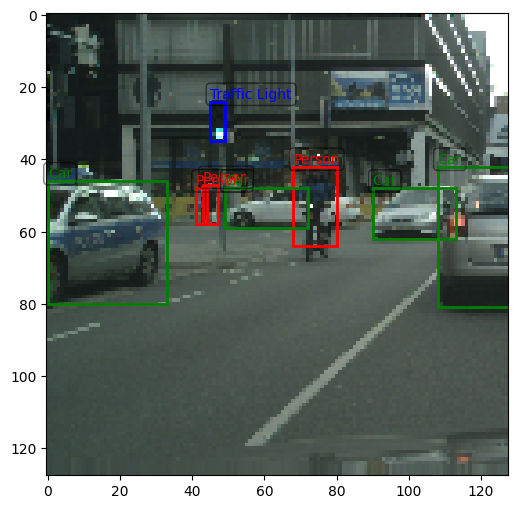

In [29]:
img_id = 8

def visualize_image_with_coloured_bounding_box(image, labels):

    label_colors = {0: "r", 1: "b", 2: "g"}
    label_names = {0: "Person", 1: "Traffic Light", 2: "Car"}

    # Create a figure and axis for plotting
    fig, ax = plt.subplots(figsize=(6, 6))

    # Display the image
    ax.imshow(image)

    # Iterate over bounding boxes and labels
    for box in labels:
        label_id, x1, y1, x2, y2 = box
        width = x2 - x1
        height = y2 - y1

        # Create a rectangle patch for the bounding box with hatch pattern
        rect = patches.Rectangle(
            (x1, y1),
            width,
            height,
            linewidth=2,
            edgecolor=label_colors[label_id],
            facecolor='none',
        )

        # Define properties for the label text box
        label_props = dict(
            boxstyle='round',
            facecolor='none',  # Transparent background
            alpha=0.5
        )

        # Add the rectangle and label to the plot
        ax.add_patch(rect)
        ax.text(
            x1,
            y1 - 4,
            label_names[label_id],
            fontsize=10,
            color=label_colors[label_id],  # Match the label color
            verticalalignment='top',
            bbox=label_props
        )

    # Display the plot
    plt.show()

# Visualize the chosen image with its bounding boxes
visualize_image_with_coloured_bounding_box(images[img_id], raw_labels[img_id])

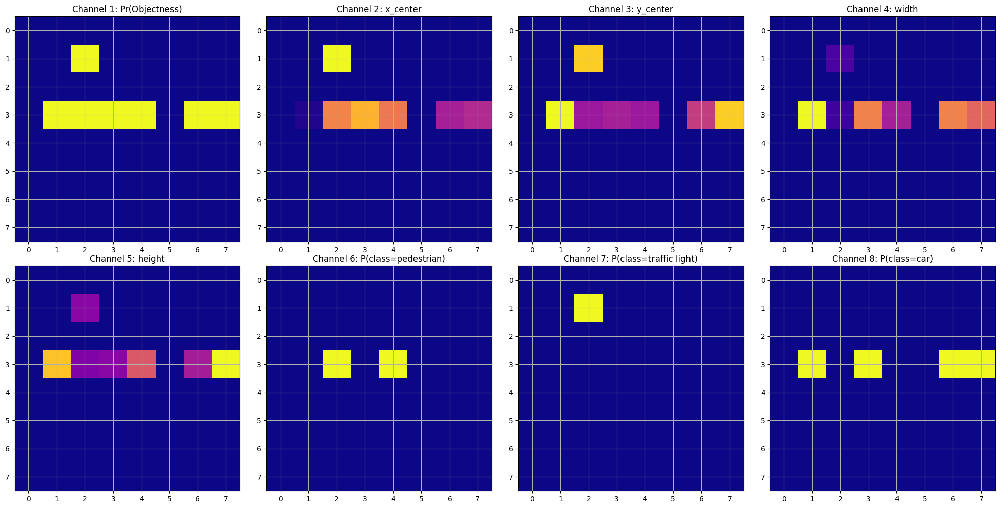

In [30]:
def visualize_processed_label(processed_label, raw_labels, chosen_image_idx):
    # Define channel mappings
    channel_mappings = {
        0: "Pr(Objectness)",
        1: "x_center",
        2: "y_center",
        3: "width",
        4: "height",
        5: "P(class=pedestrian)",
        6: "P(class=traffic light)",
        7: "P(class=car)"
    }

    # Create subplots
    num_channels = processed_label.shape[-1]
    num_rows, num_cols = 2, 4
    fig, axarr = plt.subplots(num_rows, num_cols, figsize=(20, 10))

    # Flatten the subplot array for easier indexing
    axarr = axarr.flatten()

    for i in range(num_channels):
        ax = axarr[i]
        ax.grid()
        ax.set_xticks([i for i in range(num_channels)])
        ax.imshow(processed_label[:, :, i], cmap="plasma")
        ax.set_title(f"Channel {i + 1}: {channel_mappings[i]}")

    # Remove empty subplots if there are fewer than 8 channels
    for i in range(num_channels, num_rows * num_cols):
        fig.delaxes(axarr[i])

    # Show the visualization
    plt.tight_layout()
    plt.show()

# Call the function with the processed label and other relevant parameters
processed_label = process_labels([raw_labels[img_id]])
visualize_processed_label(processed_label, raw_labels, 8)

Objects after processing raw labels:  7


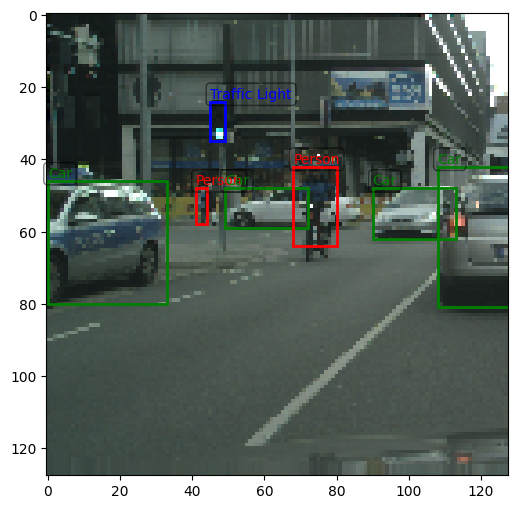

In [31]:
# Convert back to the original representation (test cases below should pass).
raw_label_from_processed = reconstruct_raw_labels(processed_label)
print("Objects after processing raw labels: ",len(raw_label_from_processed))
visualize_image_with_coloured_bounding_box(images[img_id], raw_label_from_processed)

2. Implement the loss function. (3%) (code implemented above)

The loss function comprises three main components:

Localization Loss: This represents the discrepancies between the predicted bounding box and the actual ground truth.

Classification Loss: It pertains to the errors in the class predictions.

Confidence Loss: This loss accounts for the confidence score discrepancies in object detection.

$$ \text{Loss} =
{\lambda_\text{coord} \sum_{i=0}^{S^2} \sum_{j=0}^B \mathbb{1}_{ij}^\text{obj} \left[{\left(x_i - \hat{x}_i\right)}^2 + {\left(y_i - \hat{y}_i\right)}^2\right]} +
{\lambda_\text{coord} \sum_{i=0}^{S^2} \sum_{j=0}^B \mathbb{1}_{ij}^\text{obj} \left[{\left(\sqrt{w_i} - \sqrt{\hat{w}_i}\right)}^2 + {\left(\sqrt{h_i} - \sqrt{\hat{h}_i}\right)}^2\right]} +
{\sum_{i=0}^{S^2} \sum_{j=0}^B \mathbb{1}_{ij}^\text{obj} \left(C_i - \hat{C}_i\right)^2} +
{\lambda_\text{no obj} \sum_{i=0}^{S^2} \sum_{j=0}^B \mathbb{1}_{ij}^\text{no obj} \left(C_i - \hat{C}_i\right)^2} +
{\sum_{i=0}^{S^2} \mathbb{1}_{ij}^\text{obj} \sum_{c\, \in\, \text{classes}} \left(p_i(c) - \hat{p}_i(c)\right)^2}$$

3. Make block diagram of requested architecture. Label the diagram with the parts of your code which implement each component. Explain any deviations you made from the described architecture. (15%)

Network Architecture Details:

1. *Input Layer*:
    - Accepts an image of dimensions `128 x 128 x 3` (Width x Height x Channels).

2. *Convolutional Layers (with BatchNorm2d and ReLU Activation)*:
    - Each layer is followed by a `BatchNorm2d`.
    - The output from each block passes through a `ReLU` activation.

3. *Final Layer (Sigmoid Activation)*:
    - Output undergoes a `Sigmoid` activation, mapping values between `0 and 1`.

4. *Output Dimension*:
    - Produces an output tensor of size `8 x 8 x 8`.

5. *Training Details*:
    - *Learning Rate*: Utilizes a learning rate of `10e-3`.
    - *Optimizer*: Uses the `Adam` optimizer with default values for beta 1 and beta 2.

6. *Convolutional Details*:
    - Layers from `conv1` to `trans_conv8`:
        * Stride: `2`
        * Padding: `1`
    - The last layer, `conv9`:
        * Stride: `1`
        * Padding: `1`


---
*Deviations in Network Architecture:*

We introduced a `sigmoid` activation after the ninth convolutional layer (`conv9`).

*Reasons for this Deviation:*

1. *Output Range Limitation*: Ensures the model's output is between 0 and 1, making it interpretable for tasks like object detection.
2. *Gradient Control*: Helps in preventing large activations, reducing the risk of gradient issues.
3. *Improved Convergence*: Constraining outputs to [0,1] can lead to smoother and faster training convergence.

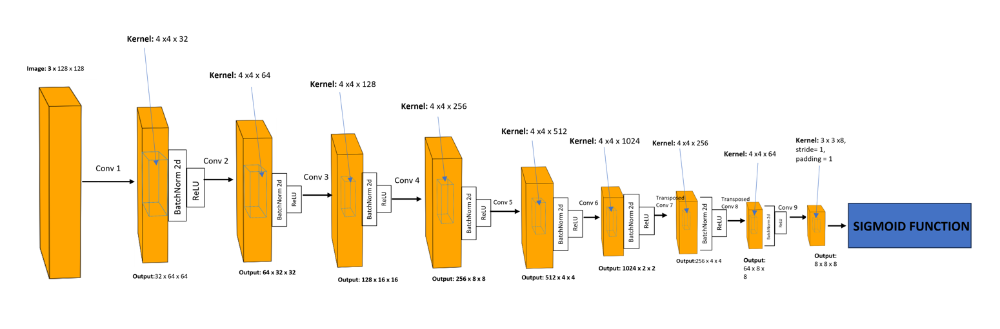

4. Show a plot of the loss over training for your model. (Raw Tensorboard output is not sufficient) (10%)

In [42]:
# Create a custom dataset class
class CustomDataset(Dataset):
    def __init__(self, images, labels, transform):
        self.images = images
        self.labels = labels
        self.transform = transform

    def __getitem__(self, idx):
        x = self.transform(self.images[idx]) if self.transform else self.images[idx]
        y = self.labels[idx]
        return x, y

    def __len__(self):
        return len(self.images)

# Call process_labels
labels = list()
for i in range(len(raw_labels)):
    label = process_labels([raw_labels[i]])
    labels.append(label)

# Define batch sizes
training_batch_size = 64
validation_batch_size = 64

# Define data transformations
data_transform = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize(0.5, 0.5)
])

count_of_training_images = int(len(images) * 0.8) # set ratio of train : val set for our model

train_dataset = CustomDataset(images[:count_of_training_images],
                              labels[:count_of_training_images],
                              data_transform)
train_loader = DataLoader(train_dataset,
                          batch_size = training_batch_size,
                          num_workers=2,
                          shuffle=True)

val_dataset = CustomDataset(images[count_of_training_images:],
                            labels[count_of_training_images:],
                            data_transform)
val_loader = DataLoader(val_dataset,
                        batch_size = validation_batch_size,
                        num_workers=1,
                        shuffle=False) # Keep shuffle false, else warning!

model = YOLO().to(device)

In [43]:
# Train your model
chk_point = pl_callbacks.ModelCheckpoint(dirpath='/content/drive/MyDrive/cis6800/yolo/checkpoints/',  # Change to your desired directory
                                         filename='model-{epoch:02d}-{validation_loss:.2f}',
                                         save_top_k=10,
                                         monitor='validation_loss',
                                         mode='min')
tensorboardb_logger = pl_loggers.TensorBoardLogger(save_dir = "logs")

trainer = pl.Trainer(logger=tensorboardb_logger,
                     max_epochs=75,
                     callbacks=[chk_point])
trainer.fit(model,
            train_loader,
            val_loader)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name        | Type       | Params
-------------------------------------------
0 | conv1       | Sequential | 1.6 K 
1 | conv2       | Sequential | 33.0 K
2 | conv3       | Sequential | 131 K 
3 | conv4       | Sequential | 525 K 
4 | conv5       | Sequential | 2.1 M 
5 | conv6       | Sequential | 8.4 M 
6 | trans_conv7 | Sequential | 4.2 M 
7 | trans_conv8 | Sequential | 262 K 
8 | conv9       | Conv2d     | 4.6 K 
-------------------------------------------
15.6 M    Trainable params
0         Non-trainable params
15.6 M    Total par

Sanity Checking: 0it [00:00, ?it/s]

Mean Average Precision (mAP) of Epoch 0: 0.0


Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Mean Average Precision (mAP) of Epoch 5: 0.0011399397856059485


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Mean Average Precision (mAP) of Epoch 10: 0.03912686037750088


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Mean Average Precision (mAP) of Epoch 15: 0.13048456293509808


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Mean Average Precision (mAP) of Epoch 20: 0.24076931495688353


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Mean Average Precision (mAP) of Epoch 25: 0.3201890777855783


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Mean Average Precision (mAP) of Epoch 30: 0.40654231729270135


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Mean Average Precision (mAP) of Epoch 35: 0.45612404478084867


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Mean Average Precision (mAP) of Epoch 40: 0.4944444473313888


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Mean Average Precision (mAP) of Epoch 45: 0.5295331426065378


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Mean Average Precision (mAP) of Epoch 50: 0.5532552232294432


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Mean Average Precision (mAP) of Epoch 55: 0.5674282893698686


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Mean Average Precision (mAP) of Epoch 60: 0.5824914593557965


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Mean Average Precision (mAP) of Epoch 65: 0.589188451746023


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Mean Average Precision (mAP) of Epoch 70: 0.5932386194109049


Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Mean Average Precision (mAP) of Epoch 75: 0.5968011372925063


INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=75` reached.


In [44]:
trainer.save_checkpoint("/content/drive/MyDrive/yolo_model.ckpt")

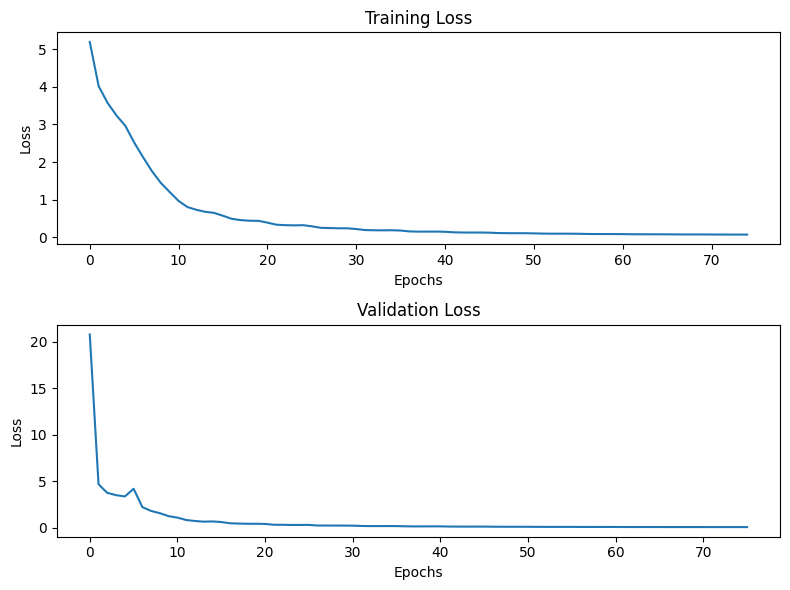

In [45]:
def plot_loss(train_losses, val_losses):
    fig, ax = plt.subplots(2, 1, figsize=(8, 6))

    # Plot training loss
    ax[0].plot(train_losses)
    ax[0].set_xlabel("Epochs")
    ax[0].set_ylabel("Loss")
    ax[0].set_title("Training Loss")

    # Plot validation loss
    ax[1].plot(val_losses)
    ax[1].set_xlabel("Epochs")
    ax[1].set_ylabel("Loss")
    ax[1].set_title("Validation Loss")

    plt.tight_layout()
    plt.show()

# Usage
# plot_loss(model.training_losses_epoch, model.validation_losses_epoch)

In [46]:
%load_ext tensorboard
# %reload_ext tensorboard
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

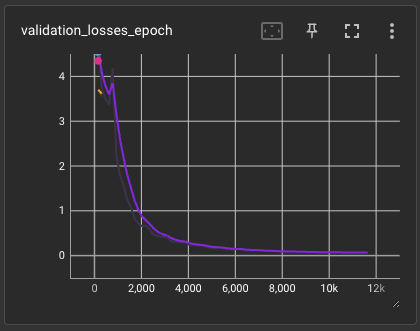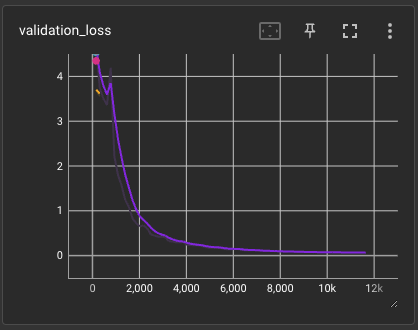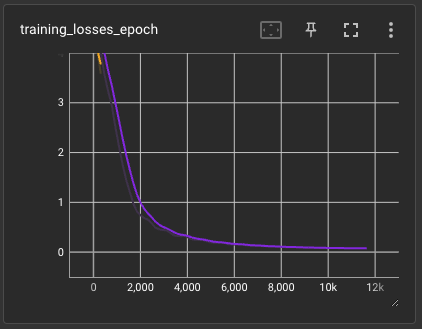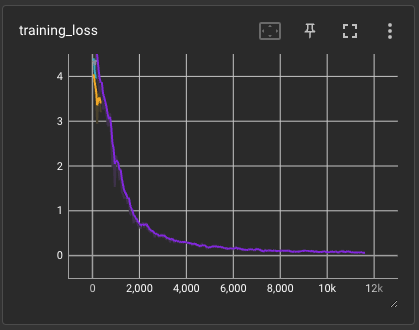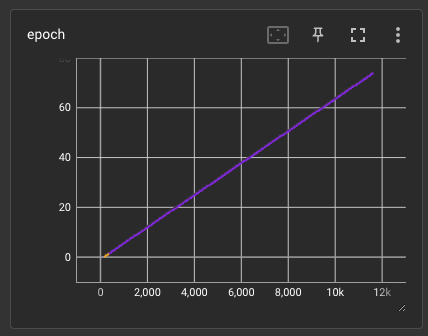

In [ ]:
model = YOLO.load_from_checkpoint(checkpoint_path="/content/drive/MyDrive/yolo_model.ckpt")

In [47]:
def tensor_to_image(tensor):
    image = torch.permute(tensor, (1, 2, 0))

    image = (image + 1) * 127.5

    image = np.array(image, dtype=np.uint8)
    return image

5. Show a plot of the mean Average Precision over training for your model. (10%)

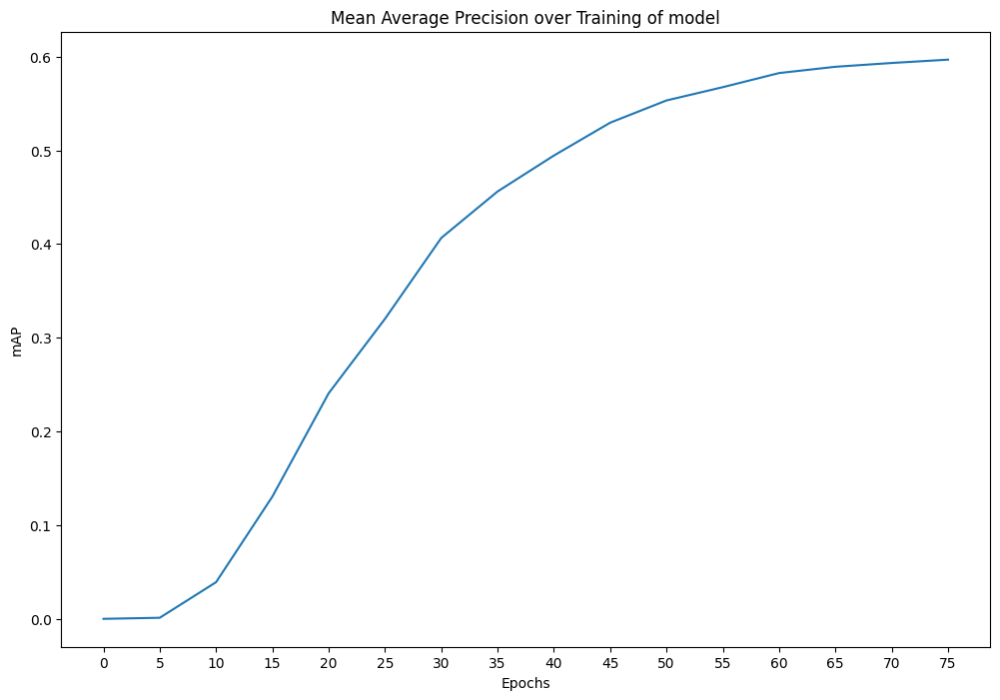

In [72]:
plt.figure(figsize = (12,8))
plt.plot(model.mean_average_precision_epoch)
plt.xticks(ticks = [i for i in range(len(model.mean_average_precision_epoch))],
           labels = [i*5 for i in range(len(model.mean_average_precision_epoch))])
plt.xlabel("Epochs")
plt.ylabel("mAP")
plt.title("Mean Average Precision over Training of model")
plt.show()

6. For one image in the inference step, show the predicted bounding boxes in the image before performing any elimination. Then, show the annotated image after the low probability bounding boxes are removed. Finally, show image after performing non-max suppression. Label each of these visualizations. See Figure 4 as an example of what this visualization should look like. (15%)

In [67]:
def visualize_image_with_bounding_box(image, labels):

    # Create a figure and axis for plotting
    fig, ax = plt.subplots(figsize=(6, 6))

    # Display the image
    ax.imshow(image)

    # Iterate over bounding boxes and labels
    for box in labels:
        label_id, x1, y1, x2, y2 = box
        width = x2 - x1
        height = y2 - y1

        # Create a rectangle patch for the bounding box with blue color
        rect = patches.Rectangle(
            (x1, y1),
            width,
            height,
            linewidth=2,
            edgecolor='b',  # Set the edge color to blue
            facecolor='none',
        )

        # Define properties for the label text box
        label_props = dict(
            boxstyle='round',
            facecolor='none',  # Transparent background
            alpha=0.5
        )

        # Add the rectangle and label to the plot
        ax.add_patch(rect)

    # Display the plot
    plt.show()

Raw prediction done below:


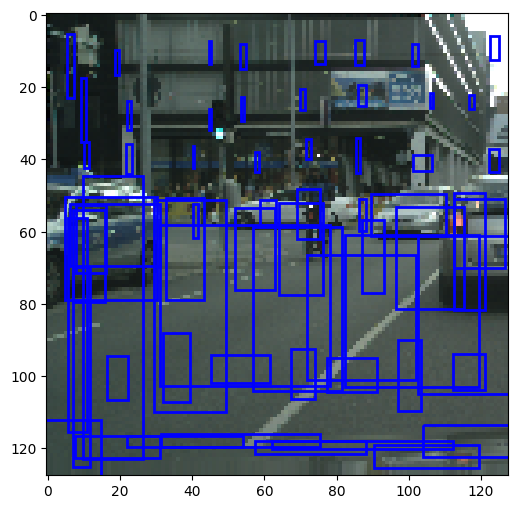


Prediction after Low Confidence suppression:


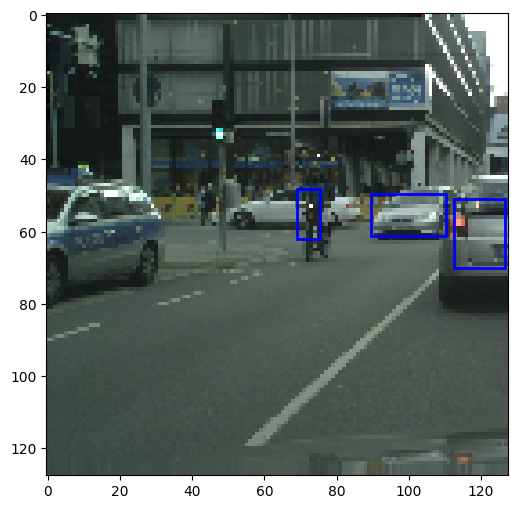


Prediction after Low confidence suppression and Non Maximal Suppression:


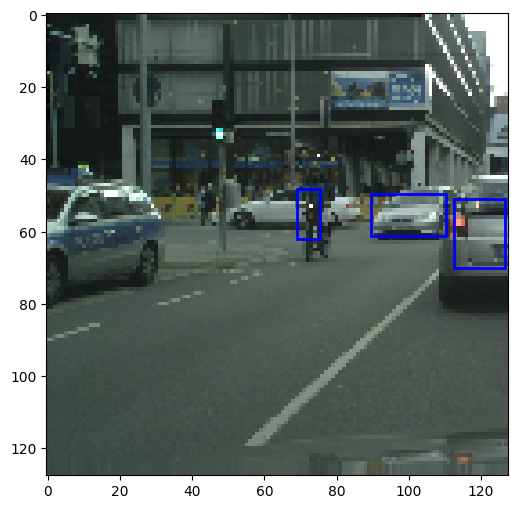

In [70]:
# Define image transformation
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(0.5, 0.5)
])

# Selected index for the image
selected_idx = 8

# Image for prediction and processing
selected_image = transform(images[selected_idx])
selected_gt_label = process_labels([raw_labels[selected_idx]])

# Get the prediction from the model
with torch.no_grad():
    pred_label = model(selected_image.unsqueeze(0))[0]

# Apply low confidence suppression and non-maximal suppression
prediction_label_np = pred_label.numpy()
prediction_low_confidence_supression = low_confidence_suppression(prediction_label_np.copy())
prediction_low_confidence_supression_nms = non_max_suppression(low_confidence_suppression(prediction_label_np.copy()))

# Visualize results
def visualize_and_print(description, labels):
    print(description)
    visualize_image_with_bounding_box(tensor_to_image(selected_image), labels)
    print()

visualize_and_print("Raw prediction done below:", reconstruct_raw_labels(prediction_label_np))
visualize_and_print("Prediction after Low Confidence suppression:", reconstruct_raw_labels(prediction_low_confidence_supression))
visualize_and_print("Prediction after Low confidence suppression and Non Maximal Suppression:", np.delete(prediction_low_confidence_supression_nms, 1, axis=-1))

7. For one image in the inference step, show the bounding boxes visualized for each class with green bounding boxes around cars, red bounding boxes around pedestrians, and blue bounding boxes around traffic lights as done in Figure 1. Show the precision/recall curves for each class in inference. Write down the achieved mean Average Precision for your inference stage. (17%)

Raw prediction done below:


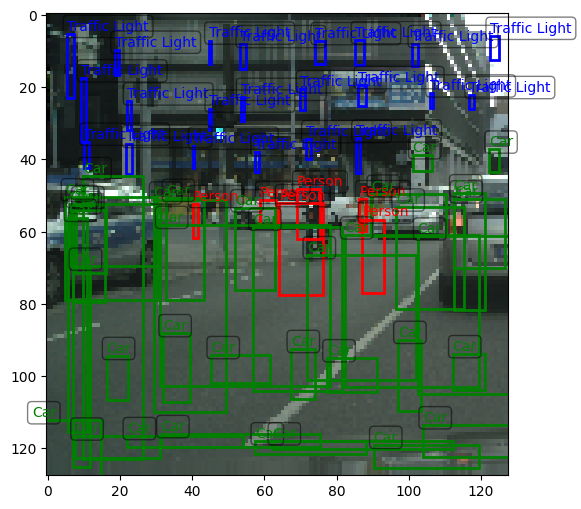


Prediction after Low Confidence suppression:


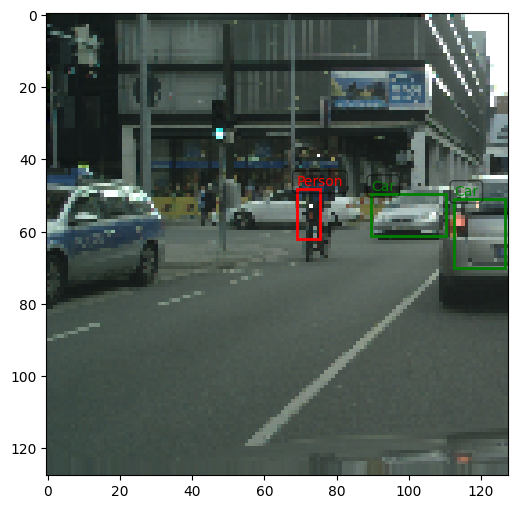


Prediction after Low confidence suppression and Non Maximal Suppression:


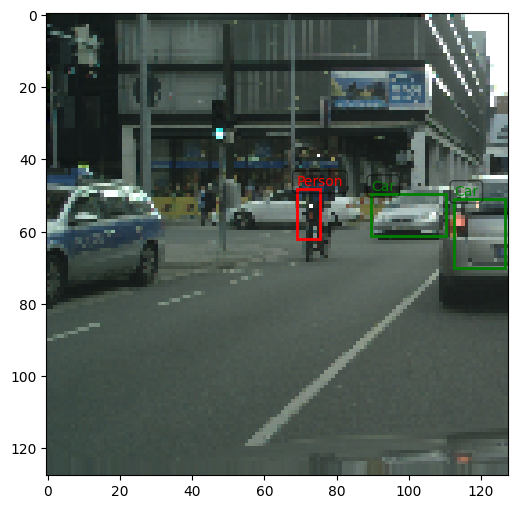

In [66]:
# Define image transformation
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(0.5, 0.5)
])

# Selected index for the image
selected_idx = 8

# Image for prediction and processing
selected_image = transform(images[selected_idx])
selected_gt_label = process_labels([raw_labels[selected_idx]])

# Get the prediction from the model
with torch.no_grad():
    pred_label = model(selected_image.unsqueeze(0))[0]

# Apply low confidence suppression and non-maximal suppression
pred_label_np = pred_label.numpy()
pred_low_conf_sup_label = low_confidence_suppression(pred_label_np.copy())
pred_low_conf_supr_nms_label = non_max_suppression(low_confidence_suppression(pred_label_np.copy()))

# Visualize results
def visualize_and_print(description, labels):
    print(description)
    visualize_image_with_coloured_bounding_box(tensor_to_image(selected_image), labels)
    print()

visualize_and_print("Raw prediction done below:", reconstruct_raw_labels(pred_label_np))
visualize_and_print("Prediction after Low Confidence suppression:", reconstruct_raw_labels(pred_low_conf_sup_label))
visualize_and_print("Prediction after Low confidence suppression and Non Maximal Suppression:", np.delete(pred_low_conf_supr_nms_label, 1, axis=-1))

In [64]:
# Initialize empty lists to store predictions and ground truth
predicted_all = []
ground_truth_all = []
max_confidence = 0

# Iterate through the validation data loader
for images_batch, labels_batch in val_loader:
    # Make predictions using the model
    predictions = model(images_batch)
    max_confidence = max(max_confidence, torch.max(predictions[:, :, :, 0]).cpu().detach().item())

    # Convert predictions and labels to numpy arrays and add them to the respective lists
    predicted_all.extend(predictions.cpu().detach().numpy())
    ground_truth_all.extend(labels_batch.cpu().detach().numpy())

# Calculate precision and recall for all classes
recall_values, precision_values = precision_recall_curve(np.array(predicted_all),
                                                         targets=np.array(ground_truth_all))

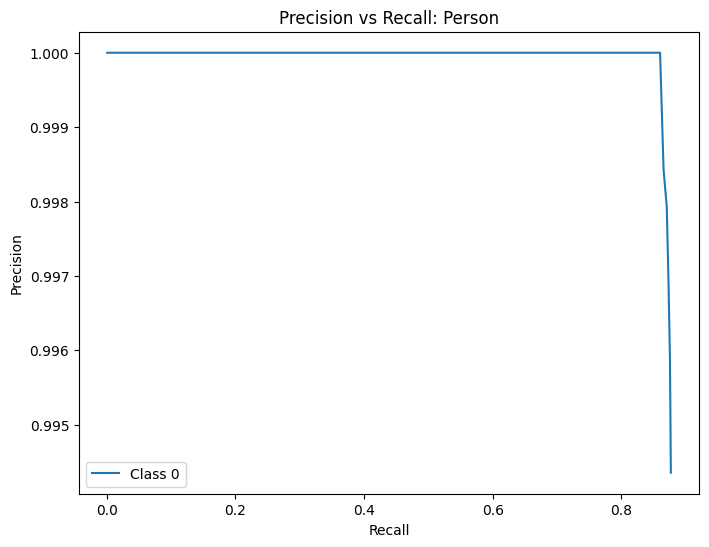

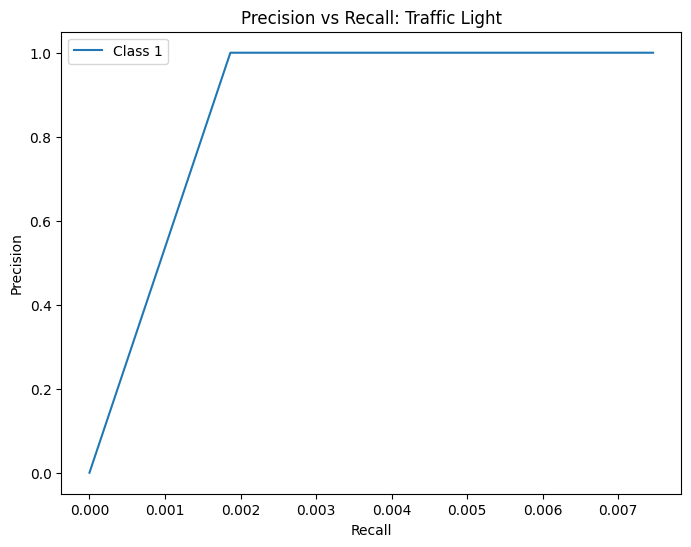

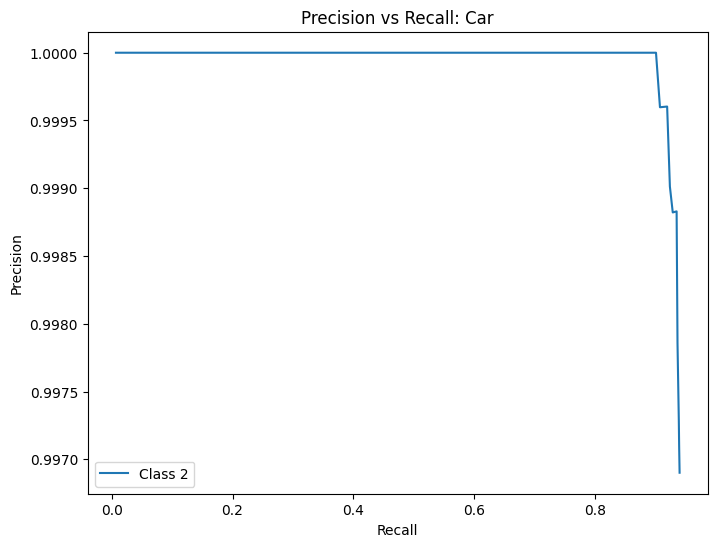

In [65]:
def plot_precision_recall_curves(recall_values, precision_values, title_map, class_labels=None, cut_start=1):
    if class_labels is None:
        class_labels = list(range(len(title_map)))

    for pred_class in class_labels:
        recall_class = recall_values[pred_class]
        sort_idx = np.argsort(recall_class)
        precision_class = np.array(precision_values[pred_class])[sort_idx]
        recall_class = np.array(recall_class)[sort_idx]

        plt.figure(figsize=(8, 6))
        plt.plot(recall_class[cut_start:], precision_class[cut_start:])
        plt.xlabel("Recall")
        plt.ylabel("Precision")
        plt.title(f"Precision vs Recall: {title_map.get(pred_class, 'Unknown Class')}")

        plt.legend([f"Class {pred_class}"])
        plt.show()

title_map = {0: "Person", 1: "Traffic Light", 2: "Car"}
class_labels = [0, 1, 2]

plot_precision_recall_curves(recall_values, precision_values, title_map, class_labels)

In [61]:
mAP_of_inference = mean_average_precision(np.array(predicted_all),
                                          np.array(ground_truth_all))
print(mAP_of_inference)

0.6063279390158415


8. Explain any issues or challenges you had with your implementation. Explain the performance you achieved and any interesting observations you made while training your network. Discuss hypotheses for how you could improve the performance of your implementation further. (20%)

## Issues & Challenges:

1. *Data Noise*: Some of the ground-truth labels were a bit noisy, which introduced challenges in training the model to high accuracy.
2. *Training Data Quantity*: Given only 10K street scene images, the quantity was not vast. This limited dataset might have caused the model to overfit.
3. *Box Overlaps*: Post-training, the YOLO algorithm was prone to predict multiple overlapping bounding boxes. Further processing with non-max suppression was required.
4. *Loss Function Complexity*: The comprehensive loss function that took into account object coordinates, object presence, and class probabilities was intricate. Ensuring correct backpropagation with such a multifaceted loss function demanded rigorous debugging.
5. *Autograder for mAP*: We faced several dimensional issues since we didn't account for zero / null values in the data. We were able to resolve this after a substantial effort.

## Performance & Observations:

1. *Learning Rate Sensitivity*: The model was quite sensitive to the learning rate at first with Adam Optimizer. We noticed spiky curves when we didn't use LR scheduler (It decreases the learning rate by a factor of 0.75 every 5 epochs). The learning rate scheduler helps fine-tune the learning rate as training progresses, which can improve convergence. Although the suggested rate of 10e-3 was a good starting point, adaptively adjusting it during training led to better convergence using decay.
every 5 epochs.
2. *Epoch Selection*: Monitoring the train & validation loss as well as mAP curve are plateaued. It should be noted that both the losses converge to approximately the same value. Hence, the model is trained well.
3. *Sigmoid Activation*: The introduction of a sigmoid activation after the `conv9` layer was crucial. This change ensured the outputs were contained between 0 and 1, aiding in a faster and smoother convergence. However, one should be careful while using sigmoid. As seen in HW 1: sigmoid activation can cause the network to stuck at very large or small value, due to vanishing gradient. However, our case didn't exemplify this.
4. *mAP Values*: The model's mean Average Precision (mAP) was satisfactory. However, it's essential to note that it might not be comparable to more sophisticated models trained on bigger datasets.

## Improvements & Hypotheses:

1. *Data Augmentation*: To help the model generalize better, introducing data augmentations might be beneficial. This will be beneficial for traffic light class, which is severely imbalanced.
2. *Regularization*: Techniques like dropout might be a worthy addition to combat the overfitting issue, especially given the dataset's limited size.
3. *Tweaking Hyperparameters*: Experimenting beyond the recommended values, like $\lambda_\text{coord} = 5$ and $\lambda_\text{no obj} = 0.5$, might yield better outcomes.
4. *Deeper Network*: A deeper architecture or the introduction of skip connections might help in capturing finer image details.
5. Image clarity: Right off the bat, when we saw the images, we noticed that they were of subpar quality. Hence, fetching good quality data would be beneficial that will ameliorate the metrics that we use.